## Diving into Google’s Gemini API

### Get Google's Gemini API in VSCode


In [ ]:
# pip install --upgrade google-generativeai 

In [ ]:
#pip show google-geneativeai

"""
Name: google-generativeai
Version: 0.8.5
Summary: Google Generative AI High level API client library and tools.
Home-page: https://github.com/google/generative-ai-python
Author: Google LLC
Author-email: googleapis-packages@google.com
License: Apache 2.0
Location: /Users/viv/Generative AII/llm/lib/python3.12/site-packages
Requires: google-ai-generativelanguage, google-api-core, google-api-python-client, google-auth, protobuf, pydantic, tqdm, typing-extensions

"""

Note: you may need to restart the kernel to use updated packages.


### Loading Google's API Key - Global Setup

In [2]:
import os

### Import the Libraries

In [5]:
import tqdm as notebook_tqdm
import google.generativeai as genai
print(f"Print genai version: {genai.__version__}")

Print genai version: 0.8.5


### Note: The Google library is more complex and has multiple authentication methods. The google.generativeai library needs the key to be explicitly set. 

-  Install python-dotenv

- Create a .env file (Create a .env file in your project's root directory. This file should contain API keys without the export keyword like: OPENAI_API_KEY='my openai key here'
HF_TOKEN='my hf token here'
GOOGLE_API_KEY='my google key here')

- This .env file is hidden by default in macOS so unhide it to check.



#### Loading the Google's API Key using dotenv

In [6]:
from dotenv import load_dotenv, find_dotenv
load_dotenv(find_dotenv(), override=True)

# load_dotenv() -> Loads environment variables into our current IDE (VSCode)
# find_dotenv() -> Automatically searches for .env file inside the directory

True

In [ ]:
genai.configure(api_key=os.environ.get("GOOGLE_API_KEY"))
print("Google API Key Set")

Google API Key Set


In [22]:
# To configure and check the working of genai api key and the list of all the api models provided
for model in genai.list_models():
    print(model.name)

E0000 00:00:1759508810.487198  407353 alts_credentials.cc:93] ALTS creds ignored. Not running on GCP and untrusted ALTS is not enabled.


models/embedding-gecko-001
models/gemini-2.5-pro-preview-03-25
models/gemini-2.5-flash-preview-05-20
models/gemini-2.5-flash
models/gemini-2.5-flash-lite-preview-06-17
models/gemini-2.5-pro-preview-05-06
models/gemini-2.5-pro-preview-06-05
models/gemini-2.5-pro
models/gemini-2.0-flash-exp
models/gemini-2.0-flash
models/gemini-2.0-flash-001
models/gemini-2.0-flash-exp-image-generation
models/gemini-2.0-flash-lite-001
models/gemini-2.0-flash-lite
models/gemini-2.0-flash-preview-image-generation
models/gemini-2.0-flash-lite-preview-02-05
models/gemini-2.0-flash-lite-preview
models/gemini-2.0-pro-exp
models/gemini-2.0-pro-exp-02-05
models/gemini-exp-1206
models/gemini-2.0-flash-thinking-exp-01-21
models/gemini-2.0-flash-thinking-exp
models/gemini-2.0-flash-thinking-exp-1219
models/gemini-2.5-flash-preview-tts
models/gemini-2.5-pro-preview-tts
models/learnlm-2.0-flash-experimental
models/gemma-3-1b-it
models/gemma-3-4b-it
models/gemma-3-12b-it
models/gemma-3-27b-it
models/gemma-3n-e4b-it
mo

#### Generating Text From Text Prompts

In [ ]:
# Importing Packages
from google import generativeai as genai
import os
from dotenv import find_dotenv, load_dotenv

# Setting up the dotenv for api files
load_dotenv(find_dotenv(), override=True)

# Call the API Key
google_api_key = os.environ.get("GOOGLE_API_KEY")
genai.configure(api_key=google_api_key)

# Selecting the Model
model = genai.GenerativeModel(model_name="gemini-2.5-flash")

# Generating Content
response = model.generate_content("Explain Hip Hop to a 10 Year Old Boy in 4 pointers")

print(response.text)

# To hide the warning - E0000 00:00:1759515792.091781  407353 alts_credentials.cc:93] ALTS creds ignored. Not running on GCP and untrusted ALTS is not enabled.
#import logging
#logging.getLogger("grpc").setLevel(logging.ERROR)

E0000 00:00:1759517485.401524  615797 alts_credentials.cc:93] ALTS creds ignored. Not running on GCP and untrusted ALTS is not enabled.


Here are four pointers to explain Hip Hop to a 10-year-old boy:

1.  **It's a super cool type of music and culture!** Imagine someone telling an awesome story or sharing their thoughts by rhyming words really fast over exciting beats – that's called **rapping** (or MCing!). The music often has a strong, catchy rhythm that makes you want to move.

2.  **It started in New York City a long time ago, in the 1970s.** Kids and teenagers in a neighborhood called the Bronx created Hip Hop as a fun way to throw parties, dance, and express themselves when they didn't have many other things to do. It was all about having a good time and being creative!

3.  **Hip Hop isn't just rapping; it has four main parts:**
    *   **DJing:** The person who plays and mixes all the cool music and beats.
    *   **MCing:** The rapper who rhymes the words and tells stories.
    *   **B-boying/B-girling (Breakdancing):** Amazing dancers who do acrobatic moves on the floor.
    *   **Graffiti Art:** Cool, colorfu

In [ ]:
# To get model information that we used above
model_info = genai.get_model("models/gemini-2.5-flash")
print(model_info)

E0000 00:00:1759517562.593167  615797 alts_credentials.cc:93] ALTS creds ignored. Not running on GCP and untrusted ALTS is not enabled.


Model(name='models/gemini-2.5-flash',
      base_model_id='',
      version='001',
      display_name='Gemini 2.5 Flash',
      description=('Stable version of Gemini 2.5 Flash, our mid-size multimodal model that '
                   'supports up to 1 million tokens, released in June of 2025.'),
      input_token_limit=1048576,
      output_token_limit=65536,
      supported_generation_methods=['generateContent',
                                    'countTokens',
                                    'createCachedContent',
                                    'batchGenerateContent'],
      temperature=1.0,
      max_temperature=2.0,
      top_p=0.95,
      top_k=64)


### Streaming Gemini Responses

In [ ]:
from google import generativeai as genai
import os
import tqdm

# Find the API Key
from dotenv import load_dotenv, find_dotenv
load_dotenv(find_dotenv(), override=True)

# Load the API Key
genai.configure(api_key=os.environ.get("GOOGLE_API_KEY"))

# Select the Model
model = genai.GenerativeModel(model_name="gemini-2.5-flash")

# View the Model Info
model_info = genai.get_model("gemini-2.5-flash")
# print model_info

# Input Prompt to check streaming responses
prompt = """Explain the history of Hip Hop culture in detail. Break it into 5 sections: 
1. Origins 
2. DJs and MCs 
3. Breakdancing 
4. Graffiti 
5. Global Influence. 
Write it in a storytelling style with examples, at least 3-4 sentences per section.
"""

# Output with stream=True
response = model.generate_content(prompt, stream=True)  
print(response) # to view full output at once, may take some time to fully load

E0000 00:00:1759521629.219186  615797 alts_credentials.cc:93] ALTS creds ignored. Not running on GCP and untrusted ALTS is not enabled.
E0000 00:00:1759521629.416901  615797 alts_credentials.cc:93] ALTS creds ignored. Not running on GCP and untrusted ALTS is not enabled.


In [ ]:
# To view the response in chunks or real time streaming
for chunk in response:
    print(chunk.text, end='')
    print("-"*100) # where dashes shows where it kind of streams and shows mini chunks of responses loaded.

The story of Hip Hop culture is a vibrant testament to human creativity and resilience, born from the crucible of urban struggle and radiating outward to touch every corner of the globe. It's a tale of innovation, self-expression, and community, told----------------------------------------------------------------------------------------------------
 through beats, rhymes, moves, and art.

### 1. Origins

Our journey begins in the burnt-out, neglected boroughs of the Bronx, New York City, during the 1970s. This was a----------------------------------------------------------------------------------------------------
 time of immense social and economic hardship, where urban decay, poverty, and gang violence painted a grim backdrop for the youth. Amidst this turmoil, block parties emerged as crucial havens, offering an escape and a sense of community for young people seeking----------------------------------------------------------------------------------------------------
 joy and connec

### Generating Text From Images

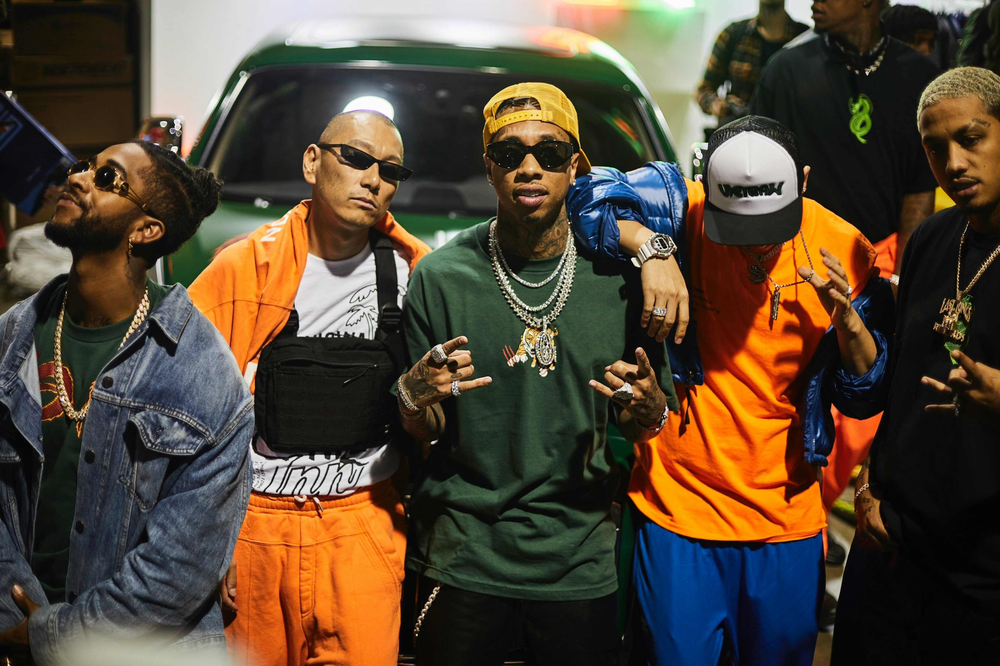

In [51]:
# pip install pillow
from PIL import Image
img = Image.open("hiphop.jpg") 
img # Using the Hip Hop Related Image

In [41]:
from google import generativeai as genai
import os

from dotenv import load_dotenv, find_dotenv
load_dotenv(find_dotenv(), override=True)

# Setup the API
genai.configure(api_key=os.environ.get("GOOGLE_API_KEY"))

# Setup the Model
model = genai.GenerativeModel("gemini-2.5-flash")

# To get Model info
model_info = genai.get_model("gemini-2.5-flash")
# print model_info

E0000 00:00:1759524230.078638  615797 alts_credentials.cc:93] ALTS creds ignored. Not running on GCP and untrusted ALTS is not enabled.


In [42]:
text_prompt = "Describe the image in detail."
response = model.generate_content([text_prompt, img])
print(response.text)

TypeError: Could not create `Blob`, expected `Blob`, `dict` or an `Image` type(`PIL.Image.Image` or `IPython.display.Image`).
Got a: <class 'PIL.JpegImagePlugin.JpegImageFile'>
Value: <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=418x379 at 0x11B738B90>

In [ ]:
# Fixing the above error and packaging the image into a format Gemini expects: {mime_type, data}.

text_prompt = "Describe the image in detail."
response = model.generate_content([text_prompt, {"mime_type": "image/jpeg", "data": open("hiphop.jpg", "rb").read()}])
print(response.text)

E0000 00:00:1759524544.454738  615797 alts_credentials.cc:93] ALTS creds ignored. Not running on GCP and untrusted ALTS is not enabled.


This image captures a group of five men, dressed in a distinct streetwear style, standing together in what appears to be an indoor or semi-enclosed setting, with a large, dark green luxury SUV or truck visible behind them. The lighting is soft and localized, highlighting the subjects against a darker, somewhat blurry background.

From left to right:

1.  **Far left:** A man with a darker complexion, a short beard, and dark hair styled in braids pulled back into a bun. He wears unique, round, dark-lensed sunglasses with intricate gold-toned metalwork extending towards his temples. He is looking upwards and slightly to the left, away from the camera. He wears a dark green t-shirt, a thick, diamond-encrusted gold chain, and a faded blue denim jacket. A gold hoop earring is visible in his left ear.

2.  **Second from left:** A man with a medium complexion and a shaved head. He sports slim, dark, rectangular sunglasses and looks directly at the camera with a stoic expression. He is dressed 

In [ ]:
# Checking the attention-to-detail in imagea and hallucination

text_prompt_1 = "Describe what vehicle it is with Brand Name and Model, you are allowed to visit websites to verify your results before final answering and feel free to say 'I don't know' if you are not sure about the vehicle."
response = model.generate_content([text_prompt, {"mime_type": "image/jpeg", "data": open("hiphop.jpg", "rb").read()}])
print(response.text)

Based on the visible features of the vehicle in the image, its brand name and model can be identified.

1.  **Color and Type**: The vehicle is a large, luxury SUV, painted in a distinctive dark green color (likely a custom paint job or wrap).
2.  **Visible Features**: Although much of the front fascia is obscured by the people, we can discern:
    *   The upper portion of a large, imposing grille.
    *   The curve of the hood leading to the windshield.
    *   The angle of the A-pillar and windshield, suggesting a significant size.
    *   Reflective elements on the roof, possibly a custom light bar, which are common modifications for luxury SUVs.
3.  **Context**: The person in the center with the yellow hat is Tyga, a well-known rapper. Celebrities like Tyga often own customized luxury SUVs.

Upon reviewing common luxury SUVs and cross-referencing with Tyga's known car collection, the visible characteristics strongly align with a **Cadillac Escalade**. Specifically, the shape of the 

In [55]:
# Checking the attention-to-detail in imagea and hallucination
text_prompt_2 = "What's the mood in the image?"
response = model.generate_content([text_prompt_2, {"mime_type":"image/jpeg", "data":open("hiphop.jpg", "rb").read()}])
print(response.text)

The mood in the image is primarily **confident, cool, and stylish, with an urban and slightly edgy vibe.**

Here's a breakdown of what contributes to that mood:

*   **Confident and Self-Assured:** The subjects' direct gazes (where visible), confident poses, and display of elaborate jewelry and streetwear project a strong sense of self-assurance and status.
*   **Cool and Trendy:** The fashionable clothing, unique accessories (like sunglasses and hats), and specific hairstyles align with contemporary urban and hip-hop culture, making the group appear very "cool" and on-trend.
*   **Serious/Intense:** Many of the facial expressions are stoic, serious, or obscured by sunglasses, contributing to an air of intensity or an unapproachable "cool." There's little overt smiling or lightheartedness.
*   **Urban/Nightlife Aesthetic:** The slightly dim lighting, hints of neon colors (green and red) in the background, and the dark green vehicle suggest an urban, perhaps nightlife or backstage setti